# Explorative Datenanalyse (EDA) für Bilddatensätze

In diesem Notebook verwenden wir die `ImageEDA`-Klasse für eine umfassende Analyse unseres Bilddatensatzes, einschließlich der Visualisierung von Bounding Boxes aus XML-Annotationen.

In [20]:
import os
import glob
import random
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import cv2
import xml.etree.ElementTree as ET
from sklearn.model_selection import train_test_split

# Fix für das joblib/loky CPU-Core Problem
import os
os.environ["LOKY_MAX_CPU_COUNT"] = "4"  # Wert an deine CPU anpassen

# Import unserer ImageEDA-Klasse
import sys
sys.path.append('../..')  # Pfad zum Hauptverzeichnis hinzufügen
from eda.visualisation import ImageEDA

## Datenpfade definieren

Wir definieren Pfade zu den verschiedenen Datenquellen (Bilder und XML-Annotationen).

In [3]:
# Aktuelles Arbeitsverzeichnis
cwd = os.getcwd()

# Haupt-Datenpfad
DATA_DIR = os.path.join(cwd, '../../data')

# Bilder-Pfad
IMAGES_DIR = os.path.join(DATA_DIR, 'images')

# XML-Annotations-Pfad
XML_DIR = os.path.join(DATA_DIR, 'groundtruth', 'annotations', 'xmls')

# Überprüfen der Verzeichnisse und Dateien
print(f"Bilder-Verzeichnis existiert: {os.path.exists(IMAGES_DIR)}")
print(f"XML-Verzeichnis existiert: {os.path.exists(XML_DIR)}")

# Ermitteln der verfügbaren Dateinamen
image_files = glob.glob(os.path.join(IMAGES_DIR, '*.jpg'))
xml_files = glob.glob(os.path.join(XML_DIR, '*.xml'))

image_basenames = set([os.path.splitext(os.path.basename(f))[0] for f in image_files])
xml_basenames = set([os.path.splitext(os.path.basename(f))[0] for f in xml_files])

# Dateien mit Bild und XML-Annotation
common_files = image_basenames & xml_basenames
print(f"Anzahl der Bilder mit Annotationen: {len(common_files)}")

Bilder-Verzeichnis existiert: True
XML-Verzeichnis existiert: True
Anzahl der Bilder mit Annotationen: 3686


## Visualisierung eines Bildes mit Bounding Box

Diese Funktion zeigt ein zufälliges Bild mit seiner entsprechenden Bounding Box aus der XML-Annotation.

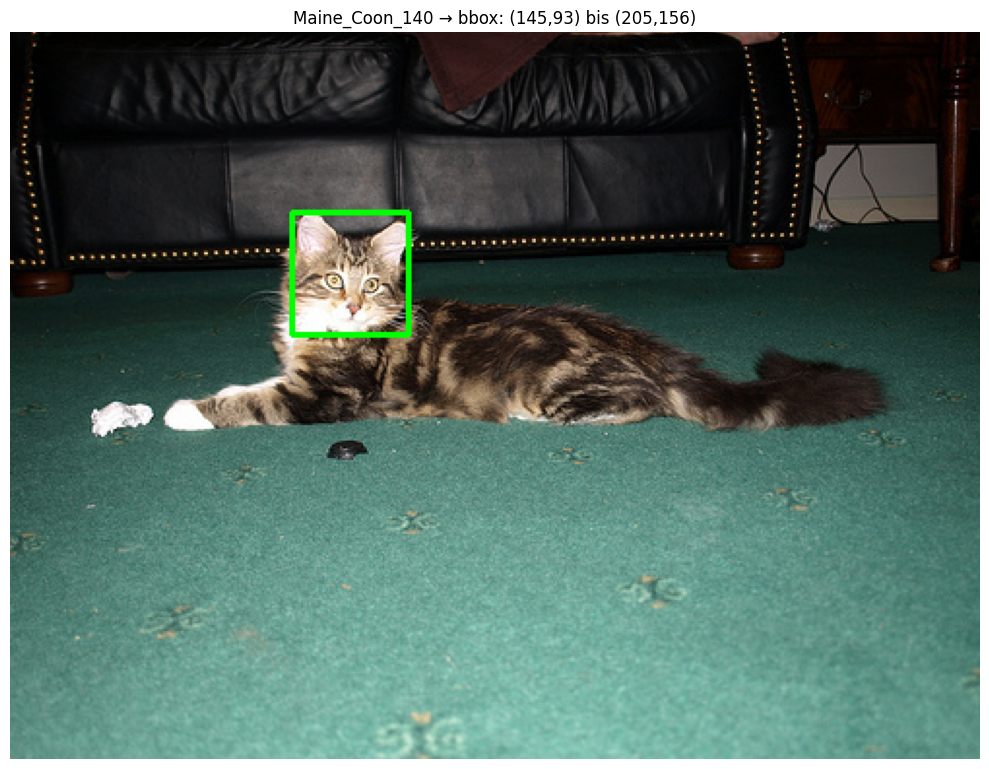

In [4]:
def show_random_image_with_bbox():
    """
    Zeigt ein zufälliges Bild mit seiner Bounding Box aus der XML-Annotation an.
    """
    if not common_files:
        print("Keine gemeinsamen Bild- und XML-Dateien gefunden!")
        return
        
    # Zufälliges Bild auswählen
    base_name = random.choice(list(common_files))
    img_path = os.path.join(IMAGES_DIR, f"{base_name}.jpg")
    xml_path = os.path.join(XML_DIR, f"{base_name}.xml")
    
    # Bild laden
    img = cv2.imread(img_path)
    if img is None:
        print(f"Konnte Bild {img_path} nicht laden!")
        return
    
    # XML-Annotation parsen
    try:
        tree = ET.parse(xml_path)
        root = tree.getroot()
        bnd = root.find('object').find('bndbox')
        xmin = int(bnd.find('xmin').text)
        ymin = int(bnd.find('ymin').text)
        xmax = int(bnd.find('xmax').text)
        ymax = int(bnd.find('ymax').text)
        
        # Bounding Box zeichnen
        cv2.rectangle(img, (xmin, ymin), (xmax, ymax), (0, 255, 0), 2)
        
        # Bild anzeigen
        img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        plt.figure(figsize=(10, 10))  # Größere Figur zur Vermeidung von Layout-Problemen
        plt.imshow(img_rgb)
        plt.axis('off')
        plt.title(f"{base_name} → bbox: ({xmin},{ymin}) bis ({xmax},{ymax})")
        plt.tight_layout()  # Verhindert Layout-Probleme
        plt.show()
    except Exception as e:
        print(f"Fehler beim Parsen der XML-Datei {xml_path}: {e}")

# Bild mit Bounding Box anzeigen
show_random_image_with_bbox()

## Visualisierung von Bildaugmentierung mit Bounding Boxes

Die folgende Analyse zeigt, wie verschiedene Augmentierungstechniken die Bilder und ihre Annotationen (Bounding Boxes) beeinflussen.

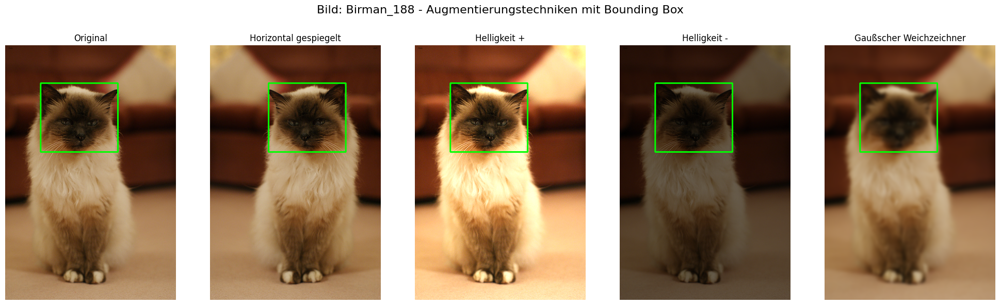

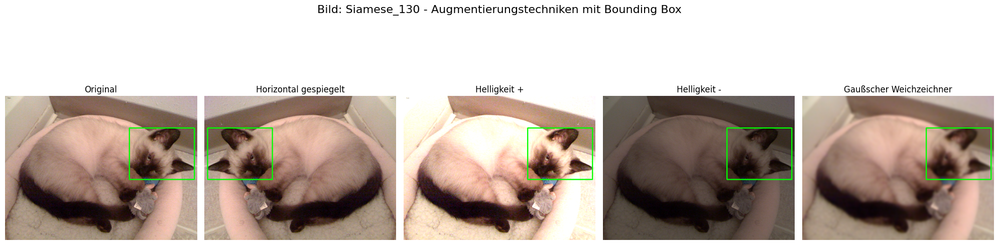

In [19]:
def show_augmented_bbox_samples(num_samples=3):
    """
    Zeigt zufällige Bilder mit Bounding Boxes und verschiedenen Augmentierungstechniken.
    """
    if not common_files:
        print("Keine gemeinsamen Bild- und XML-Dateien gefunden!")
        return
    
    # Zufällige Bilder aus dem gemeinsamen Set auswählen
    sample_base_names = random.sample(list(common_files), min(num_samples, len(common_files)))
    
    # Augmentierungstechniken
    augmentations = [
        ("Original", lambda img, bbox: (img.copy(), bbox)),
        ("Horizontal gespiegelt", lambda img, bbox: (
            cv2.flip(img, 1),  # Horizontal spiegeln
            [img.shape[1] - bbox[2], bbox[1], img.shape[1] - bbox[0], bbox[3]]  # Bbox anpassen
        )),
        ("Helligkeit +", lambda img, bbox: (
            cv2.convertScaleAbs(img, alpha=1.5, beta=0),  # Helligkeit erhöhen
            bbox  # Bbox bleibt gleich
        )),
        ("Helligkeit -", lambda img, bbox: (
            cv2.convertScaleAbs(img, alpha=0.5, beta=0),  # Helligkeit verringern
            bbox  # Bbox bleibt gleich
        )),
        ("Gaußscher Weichzeichner", lambda img, bbox: (
            cv2.GaussianBlur(img, (15, 15), 0),  # Weichzeichnen
            bbox  # Bbox bleibt gleich
        ))
    ]
    
    for base_name in sample_base_names:
        img_path = os.path.join(IMAGES_DIR, f"{base_name}.jpg")
        xml_path = os.path.join(XML_DIR, f"{base_name}.xml")
        
        # Bild laden
        img = cv2.imread(img_path)
        if img is None:
            print(f"Konnte Bild {img_path} nicht laden!")
            continue
        
        # XML-Annotation parsen
        try:
            tree = ET.parse(xml_path)
            root = tree.getroot()
            bnd = root.find('object').find('bndbox')
            xmin = int(bnd.find('xmin').text)
            ymin = int(bnd.find('ymin').text)
            xmax = int(bnd.find('xmax').text)
            ymax = int(bnd.find('ymax').text)
            bbox = [xmin, ymin, xmax, ymax]
            
            # Subplots für jede Augmentierungstechnik
            fig, axes = plt.subplots(1, len(augmentations), figsize=(20, 6))
            fig.suptitle(f"Bild: {base_name} - Augmentierungstechniken mit Bounding Box", fontsize=16)
            
            # Für jede Augmentierungstechnik
            for i, (title, aug_func) in enumerate(augmentations):
                # Augmentierung anwenden
                aug_img, aug_bbox = aug_func(img, bbox)
                
                # Bounding Box zeichnen
                aug_img_with_bbox = aug_img.copy()
                cv2.rectangle(aug_img_with_bbox, 
                              (int(aug_bbox[0]), int(aug_bbox[1])), 
                              (int(aug_bbox[2]), int(aug_bbox[3])), 
                              (0, 255, 0), 2)
                
                # Augmentiertes Bild anzeigen
                axes[i].imshow(cv2.cvtColor(aug_img_with_bbox, cv2.COLOR_BGR2RGB))
                axes[i].set_title(title)
                axes[i].axis('off')
            
            plt.tight_layout()
            plt.subplots_adjust(top=0.85)  # Platz für den Haupttitel
            plt.show()
            
        except Exception as e:
            print(f"Fehler bei der Verarbeitung von {base_name}: {e}")
    
# Zeige Augmentierungsbeispiele mit Bounding Boxes
show_augmented_bbox_samples(2)  # 2 zufällige Beispiele


## Initialisierung des EDA-Tools

Wir initialisieren unsere ImageEDA-Klasse mit den Bilddaten.

In [5]:
# ImageEDA initialisieren - wir verwenden das Bilder-Verzeichnis
try:
    eda = ImageEDA(IMAGES_DIR, category_delimiter="_")
    print(f"ImageEDA wurde erfolgreich initialisiert mit {len(eda.image_data)} Bildern.")
except Exception as e:
    print(f"Fehler bei der Initialisierung von ImageEDA: {e}")

ImageEDA wurde erfolgreich initialisiert mit 7390 Bildern.


## Analyse der Klassendistribution

Diese Methode zeigt die Verteilung der Bilder über verschiedene Kategorien.

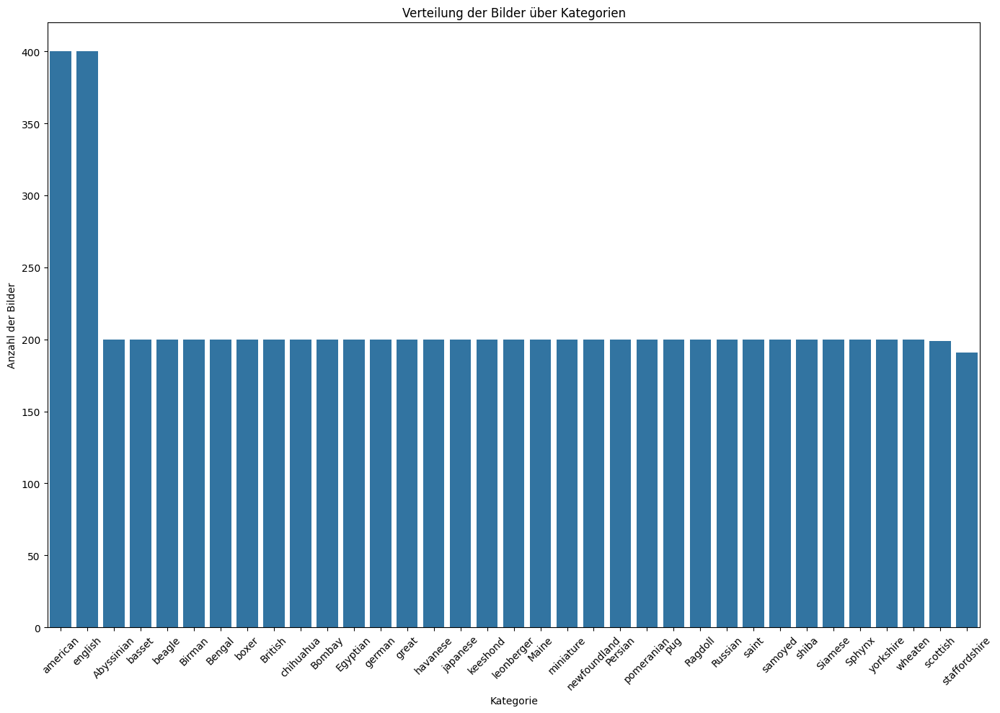

Gesamtzahl der Kategorien: 35
Gesamtzahl der Bilder: 7390
Aufschlüsselung nach Kategorien:
category
american         400
english          400
Abyssinian       200
basset           200
beagle           200
Birman           200
Bengal           200
boxer            200
British          200
chihuahua        200
Bombay           200
Egyptian         200
german           200
great            200
havanese         200
japanese         200
keeshond         200
leonberger       200
Maine            200
miniature        200
newfoundland     200
Persian          200
pomeranian       200
pug              200
Ragdoll          200
Russian          200
saint            200
samoyed          200
shiba            200
Siamese          200
Sphynx           200
yorkshire        200
wheaten          200
scottish         199
staffordshire    191
Name: count, dtype: int64


In [6]:
# Visualisierung der Klassenverteilung mit größerer Figur
try:
    eda.show_class_distribution(figsize=(14, 10))
except Exception as e:
    print(f"Fehler bei der Anzeige der Klassenverteilung: {e}")

## Visualisierung von Beispielbildern

Hier werden Beispielbilder aus jeder Kategorie angezeigt. Wir erhöhen die Figurengröße, um Layout-Probleme zu vermeiden.

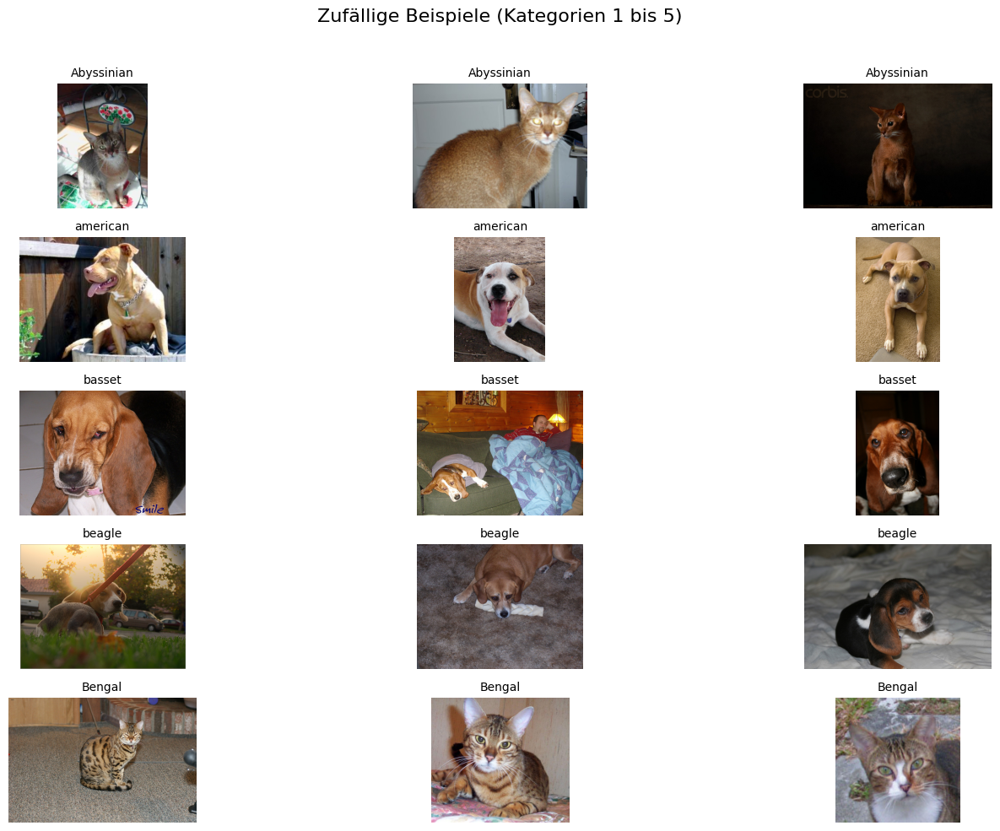

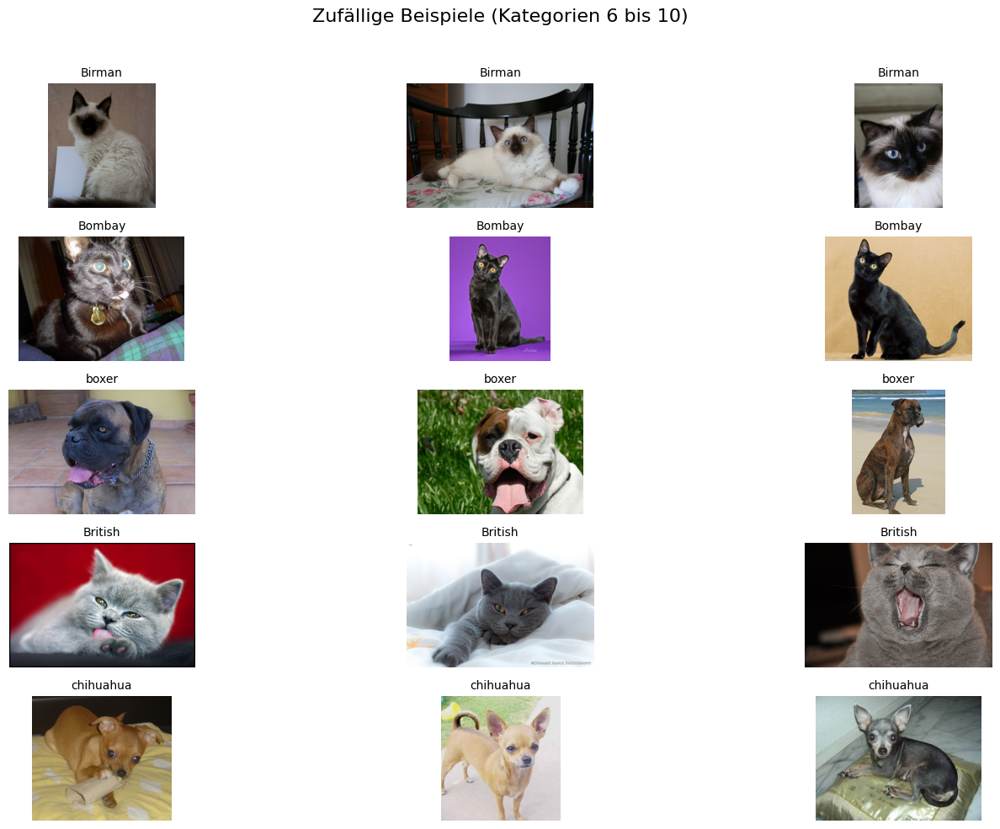

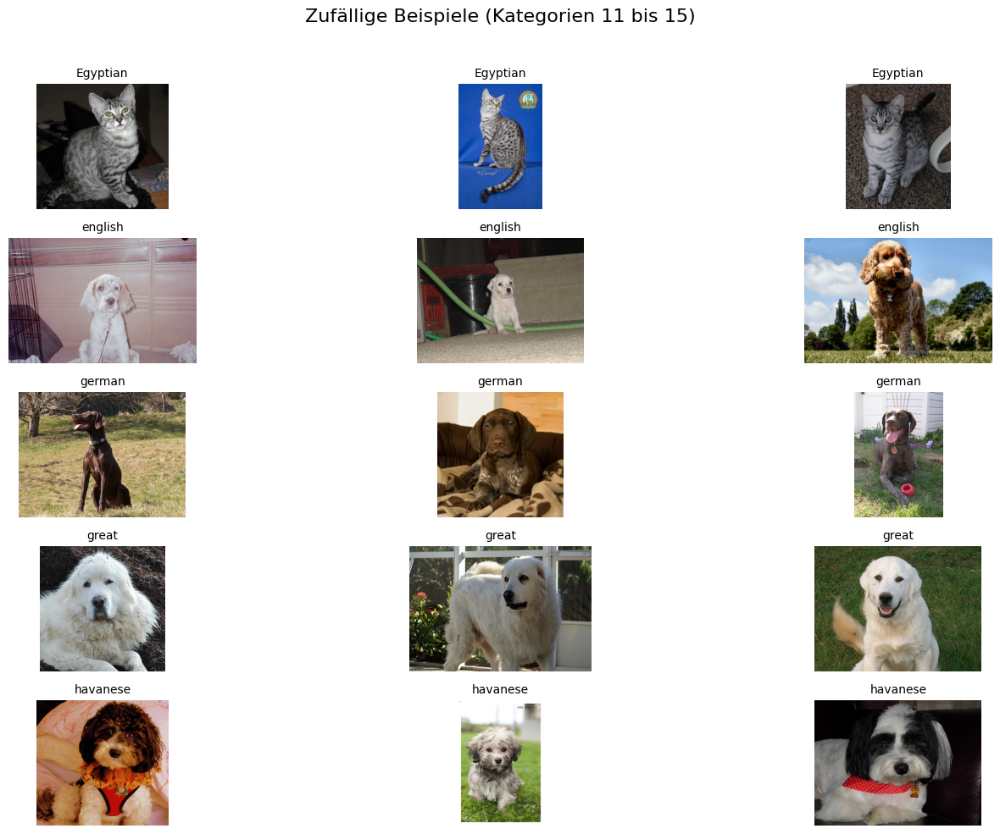

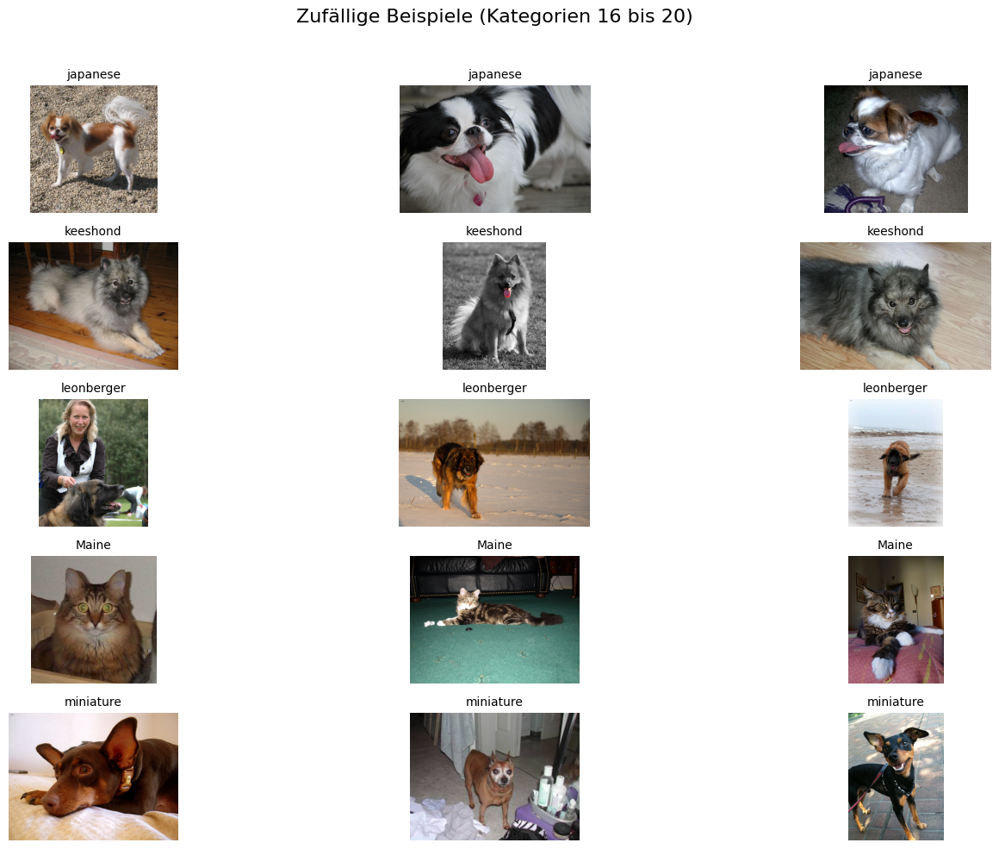

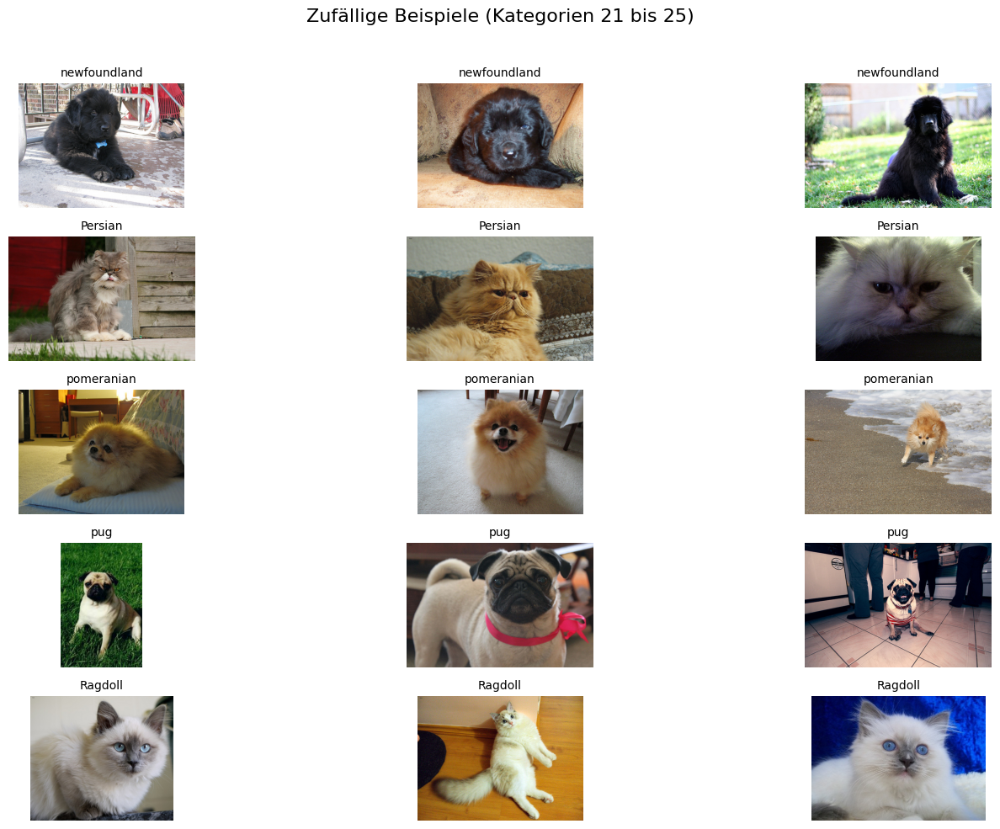

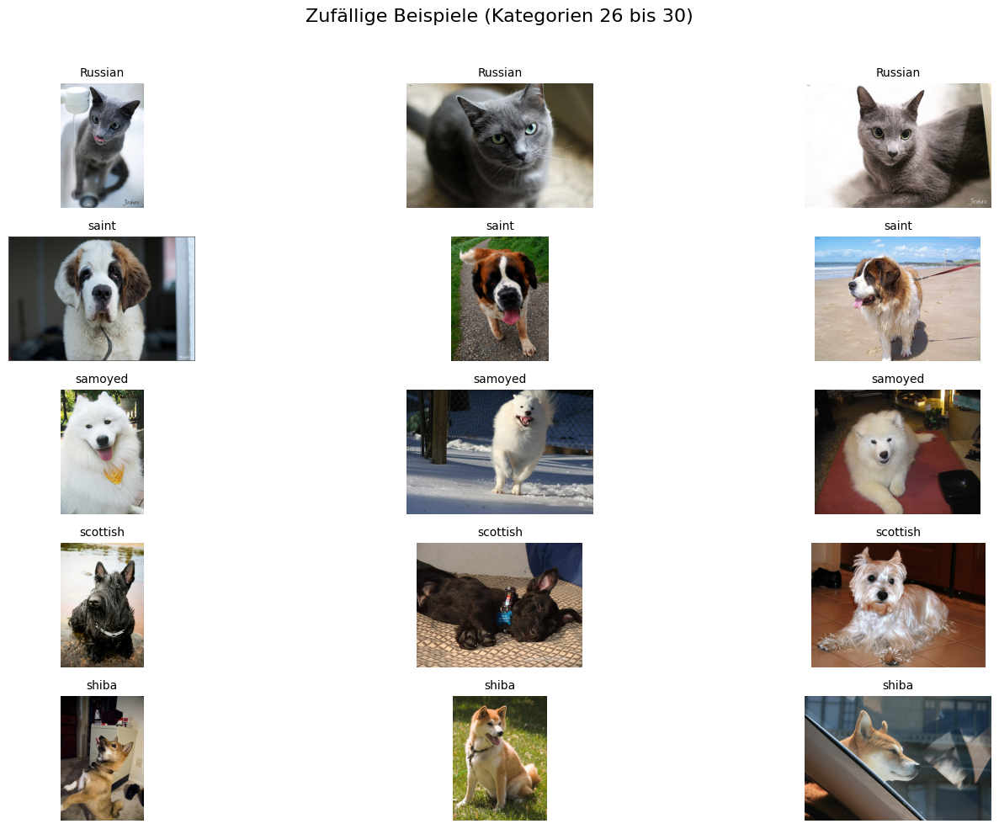

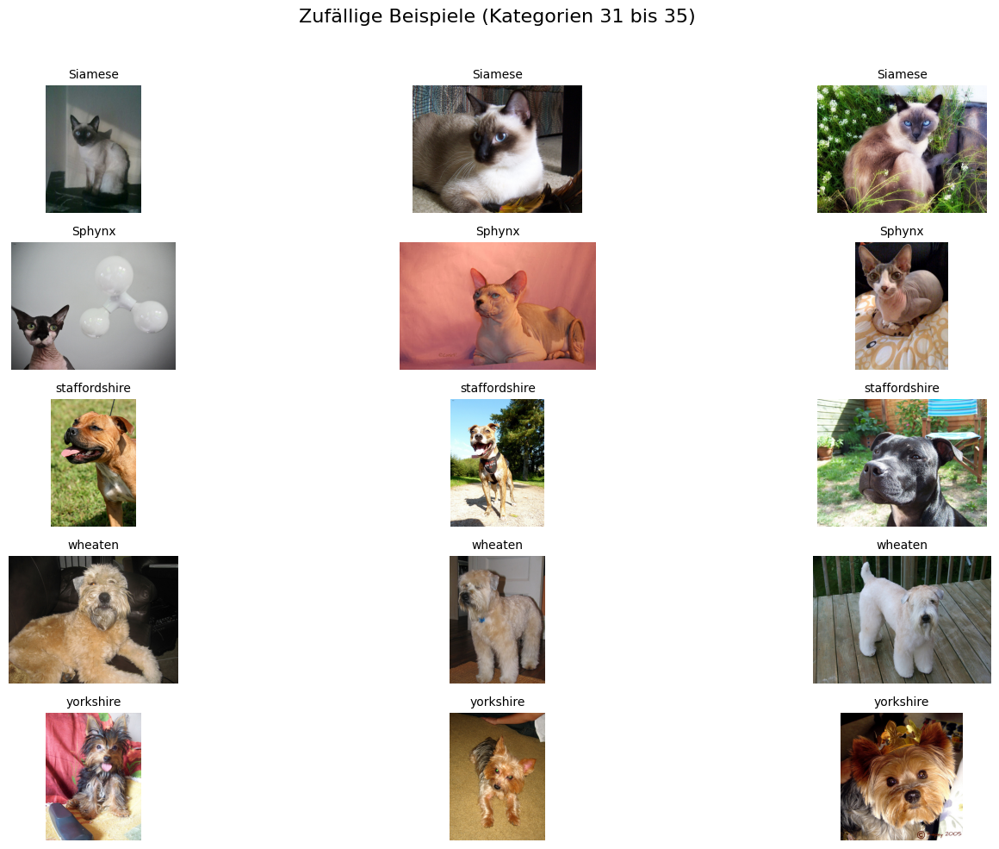

In [7]:
def show_samples_batched(eda_instance, samples_per_category=1, categories_per_page=5, figsize=(16, 10)):
    """
    Zeigt Beispielbilder in Batches an, um größere Bilder zu ermöglichen.
    
    Args:
        eda_instance: Die ImageEDA-Instanz
        samples_per_category: Anzahl der Beispielbilder pro Kategorie
        categories_per_page: Anzahl der Kategorien pro Seite/Figure
        figsize: Größe der Figure
    """
    all_categories = eda_instance.categories
    
    # Kategorien in Batches aufteilen
    for start_idx in range(0, len(all_categories), categories_per_page):
        batch_categories = all_categories[start_idx:start_idx + categories_per_page]
        
        # Figure für diesen Batch erstellen
        fig, axes = plt.subplots(
            nrows=len(batch_categories),
            ncols=samples_per_category,
            figsize=figsize,
            squeeze=False
        )
        
        plt.suptitle(f"Zufällige Beispiele (Kategorien {start_idx+1} bis {start_idx+len(batch_categories)})", 
                    fontsize=16, y=0.98)
        
        # Für jede Kategorie in diesem Batch
        for i, category in enumerate(batch_categories):
            category_data = eda_instance.image_data[eda_instance.image_data["category"] == category]
            sample_count = min(samples_per_category, len(category_data))
            
            if sample_count == 0:
                for j in range(samples_per_category):
                    axes[i, j].text(0.5, 0.5, "Keine Beispiele vorhanden", ha='center', va='center')
                    axes[i, j].axis("off")
                continue
            
            category_samples = category_data["path"].sample(sample_count).tolist()
            
            for j in range(samples_per_category):
                if j < len(category_samples):
                    try:
                        img_path = category_samples[j]
                        img = cv2.imread(img_path)
                        if img is None:
                            raise ValueError(f"Bild konnte nicht geladen werden: {img_path}")
                        img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
                        axes[i, j].imshow(img_rgb)
                        axes[i, j].set_title(f"{category}", fontsize=10)
                    except Exception as e:
                        print(f"Fehler beim Laden des Bildes {img_path}: {e}")
                        axes[i, j].text(0.5, 0.5, "Fehler beim Laden", ha='center', va='center')
                else:
                    axes[i, j].set_visible(False)
                
                axes[i, j].axis("off")
        
        plt.tight_layout(rect=[0, 0, 1, 0.96])
        plt.show()
        
        # Optionale Pause zwischen den Seiten
        if start_idx + categories_per_page < len(all_categories):
            input("Drücken Sie Enter, um die nächsten Kategorien anzuzeigen...")

# Zeige Beispiele in Batches von jeweils 5 Kategorien mit 3 Bildern pro Kategorie
show_samples_batched(eda, samples_per_category=3, categories_per_page=5)

## Analyse der Tierarten-Verteilung: Hunde vs. Katzen

Anzahl der Katzenbilder: 1600
Anzahl der Hundebilder: 2000
Anzahl der nicht klassifizierten Bilder: 3790


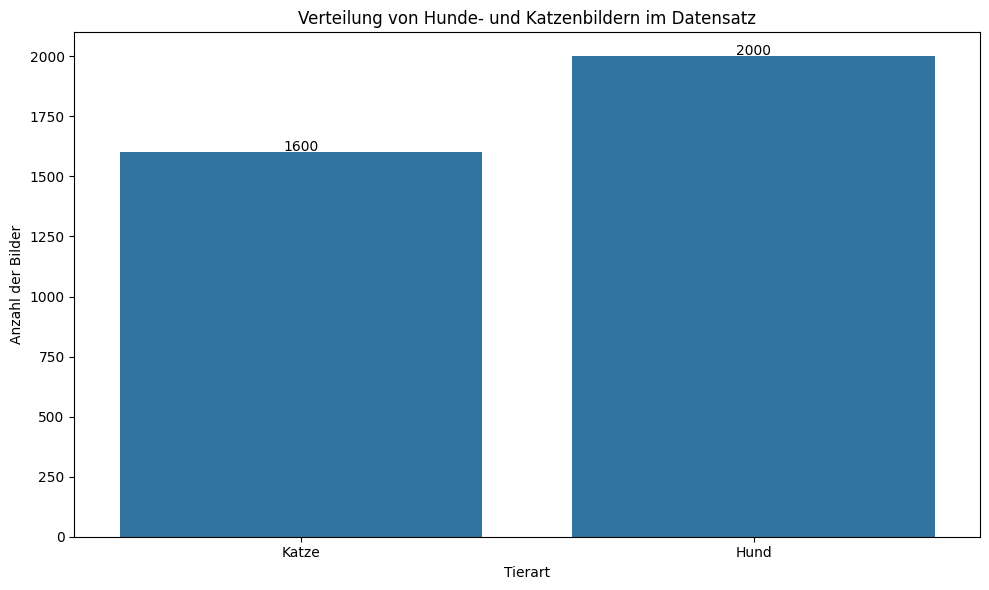

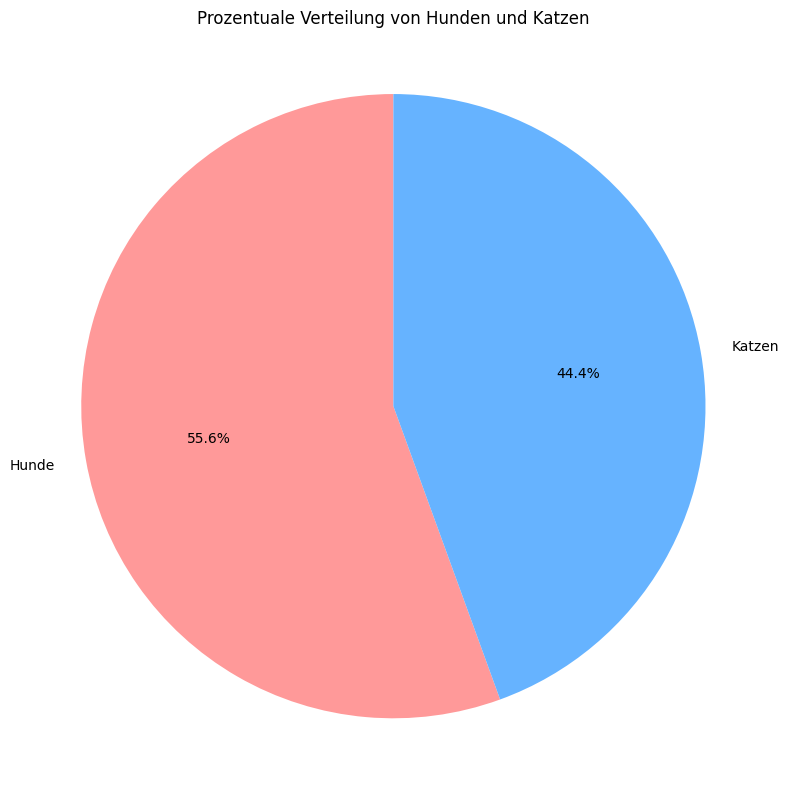

In [17]:
def analyze_cats_vs_dogs(eda_instance):
    """
    Ermittelt die Anzahl der Hunde- und Katzenbilder im Datensatz und visualisiert die Verteilung.
    
    Args:
        eda_instance: Die ImageEDA-Instanz mit den geladenen Bilddaten
    """
    # Listen von Hunde- und Katzenrassen basierend auf den Dateinamen
    katzenrassen = [
        'Abyssinian', 'Bengal', 'Birman', 'Bombay', 'British_Shorthair',
        'Egyptian_Mau', 'Maine_Coon', 'Persian', 'Ragdoll', 'Russian_Blue',
        'Siamese', 'Sphynx'
    ]
    
    hunderassen = [
        'american_bulldog', 'basset_hound', 'beagle', 'boxer', 'chihuahua',
        'english_setter', 'german_shorthaired', 'great_pyrenees', 'havanese',
        'japanese_chin', 'keeshond', 'leonberger', 'miniature_pinscher',
        'newfoundland', 'pomeranian', 'pug', 'saint_bernard', 'samoyed',
        'scottish_terrier', 'shiba_inu', 'staffordshire_bull_terrier',
        'wheaten_terrier', 'yorkshire_terrier'
    ]
    
    # Zählung initialisieren
    katzen_anzahl = 0
    hunde_anzahl = 0
    andere_anzahl = 0
    
    # Kategorie-zu-Klasse-Mapping erstellen
    kategorie_zu_klasse = {}
    for rasse in katzenrassen:
        kategorie_zu_klasse[rasse.lower()] = 'Katze'
    for rasse in hunderassen:
        kategorie_zu_klasse[rasse.lower()] = 'Hund'
    
    # Alle Kategorien zählen
    kategorien_count = eda_instance.image_data['category'].value_counts()
    
    # Nach Tierart (Hund/Katze) gruppieren
    ergebnisse = {'Katze': 0, 'Hund': 0, 'Unbekannt': 0}
    
    for kategorie, anzahl in kategorien_count.items():
        kategorie_lower = kategorie.lower()
        if kategorie_lower in kategorie_zu_klasse:
            tierart = kategorie_zu_klasse[kategorie_lower]
            ergebnisse[tierart] += anzahl
        else:
            ergebnisse['Unbekannt'] += anzahl
    
    # Ergebnisse anzeigen
    print(f"Anzahl der Katzenbilder: {ergebnisse['Katze']}")
    print(f"Anzahl der Hundebilder: {ergebnisse['Hund']}")
    if ergebnisse['Unbekannt'] > 0:
        print(f"Anzahl der nicht klassifizierten Bilder: {ergebnisse['Unbekannt']}")
    
    # Visualisierung
    plt.figure(figsize=(10, 6))
    
    # Balkendiagramm
    sns.barplot(x=list(ergebnisse.keys())[:2], y=list(ergebnisse.values())[:2])
    plt.title('Verteilung von Hunde- und Katzenbildern im Datensatz')
    plt.xlabel('Tierart')
    plt.ylabel('Anzahl der Bilder')
    
    # Werte über den Balken anzeigen
    for i, v in enumerate(list(ergebnisse.values())[:2]):
        plt.text(i, v + 5, str(v), ha='center')
    
    plt.tight_layout()
    plt.show()
    
    # Kreisdiagramm
    plt.figure(figsize=(8, 8))
    plt.pie(
        [ergebnisse['Hund'], ergebnisse['Katze']], 
        labels=['Hunde', 'Katzen'],
        autopct='%1.1f%%',
        startangle=90,
        colors=['#ff9999', '#66b3ff']
    )
    plt.axis('equal')
    plt.title('Prozentuale Verteilung von Hunden und Katzen')
    plt.tight_layout()
    plt.show()
    
    return ergebnisse

# Funktion aufrufen
ergebnisse = analyze_cats_vs_dogs(eda)

## Analyse der Bildabmessungen

Diese Analyse untersucht die Verteilung der Bildgrößen und -eigenschaften.

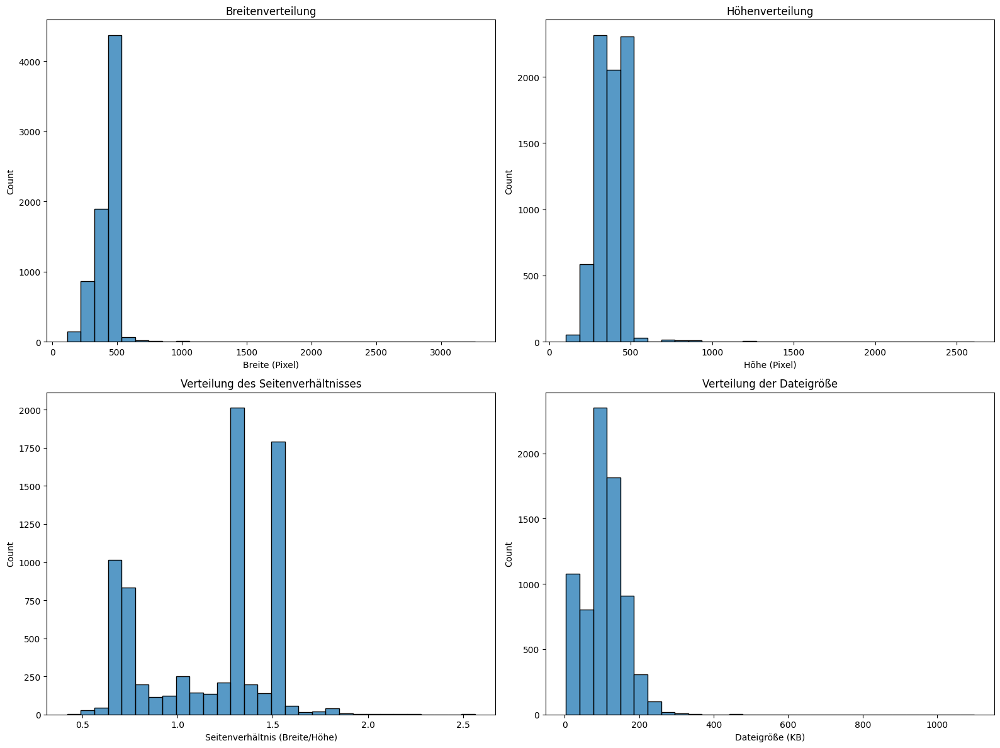

Statistiken der Bildabmessungen:
             width       height  aspect_ratio    file_size
count  7390.000000  7390.000000   7390.000000  7390.000000
mean    436.745196   390.913667      1.172343   104.737160
std     115.877300   109.586324      0.329376    57.367767
min     114.000000   103.000000      0.420000     3.344727
25%     335.000000   333.000000      0.751116    75.816650
50%     500.000000   375.000000      1.333333   105.112793
75%     500.000000   500.000000      1.492537   135.823242
max    3264.000000  2606.000000      2.564103  1098.778320


In [8]:
# Analyse der Bildabmessungen mit größerer Figur
try:
    eda.analyze_image_dimensions(figsize=(16, 12))
except Exception as e:
    print(f"Fehler bei der Analyse der Bildabmessungen: {e}")

## Farbanalyse

Analyse der dominanten Farben in den Bildern.

c:\Users\fabud\Documents\GitHub\dlbs-mc-oliver-fabian\.venv\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: constrained_layout not applied because axes sizes collapsed to zero.  Try making figure larger or Axes decorations smaller.
  fig.canvas.print_figure(bytes_io, **kw)


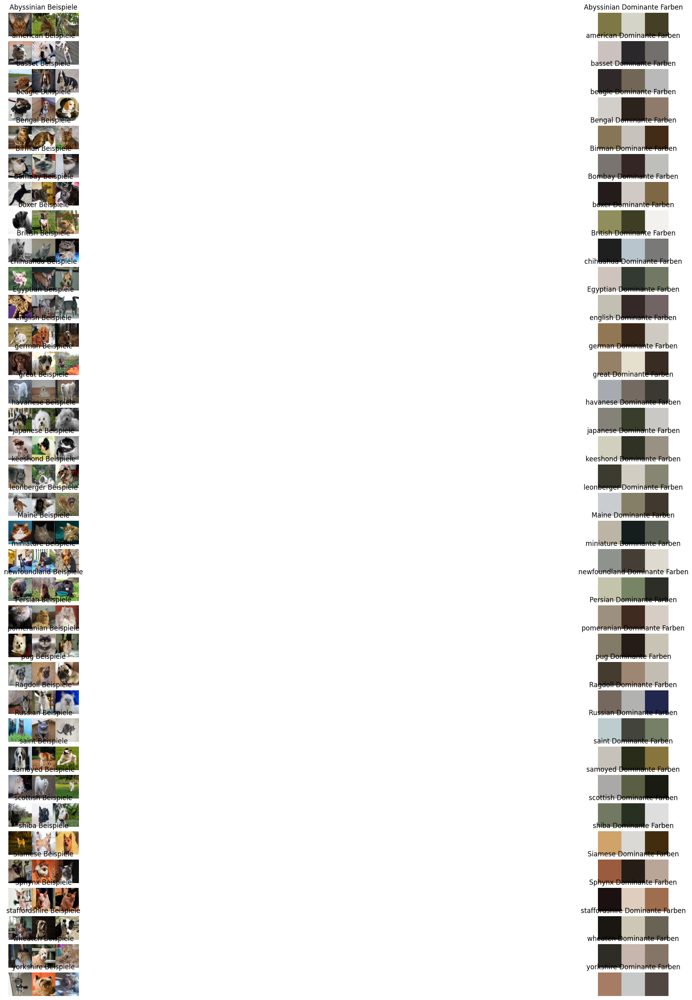

In [27]:
# Farbanalyse mit angepassten Parametern
try:
    eda.analyze_colors_by_category(samples_per_category=3, n_colors=3, figsize=(35, 32))
except Exception as e:
    print(f"Fehler bei der Farbanalyse: {e}")

## Beispiele für Bildaugmentierung

Visualisierung verschiedener Augmentierungstechniken.

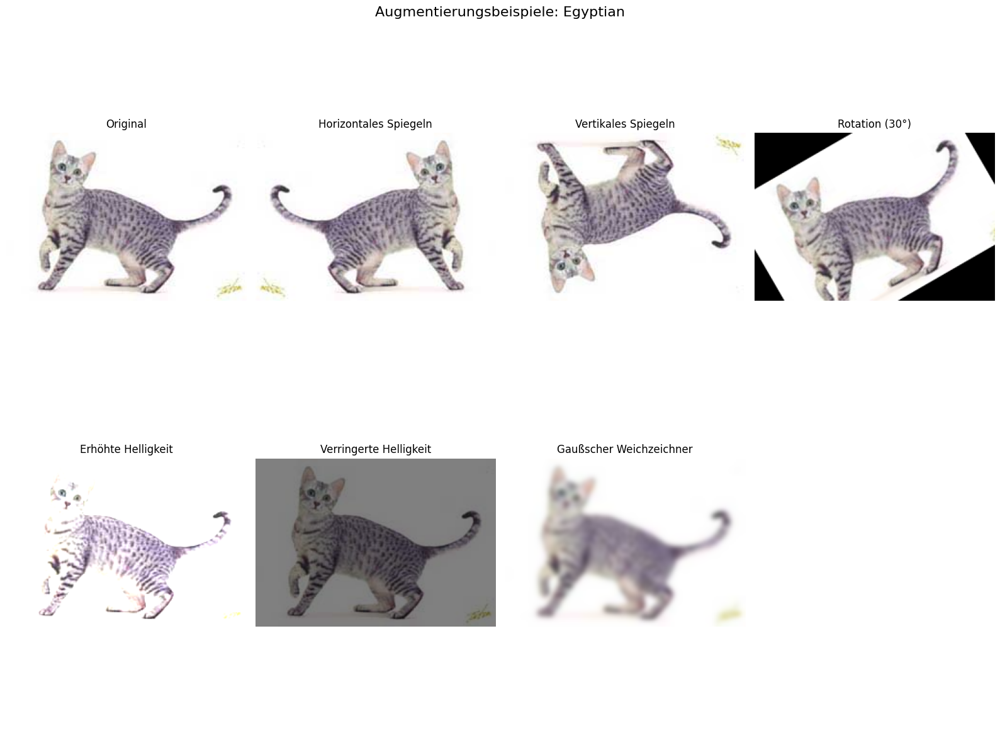

In [10]:
# Augmentierungsbeispiele mit größerer Figur
try:
    eda.show_augmentation_examples(figsize=(16, 12))
except Exception as e:
    print(f"Fehler bei der Anzeige der Augmentierungsbeispiele: {e}")

## Statistiken über Bounding Boxes

Analyse der Größe und Position der Bounding Boxes aus den XML-Annotationen.

Bounding Box Statistik:
             width       height          area  aspect_ratio
count  3687.000000  3687.000000  3.687000e+03   3687.000000
mean    171.930567   168.266341  3.506705e+04      1.035962
std      84.262229    80.613240  5.219556e+04      0.208508
min      27.000000    22.000000  6.160000e+02      0.463519
25%     110.000000   109.000000  1.219400e+04      0.899814
50%     155.000000   152.000000  2.340000e+04      1.007576
75%     219.000000   216.000000  4.683600e+04      1.157084
max    1538.000000  1535.000000  2.360830e+06      2.202765


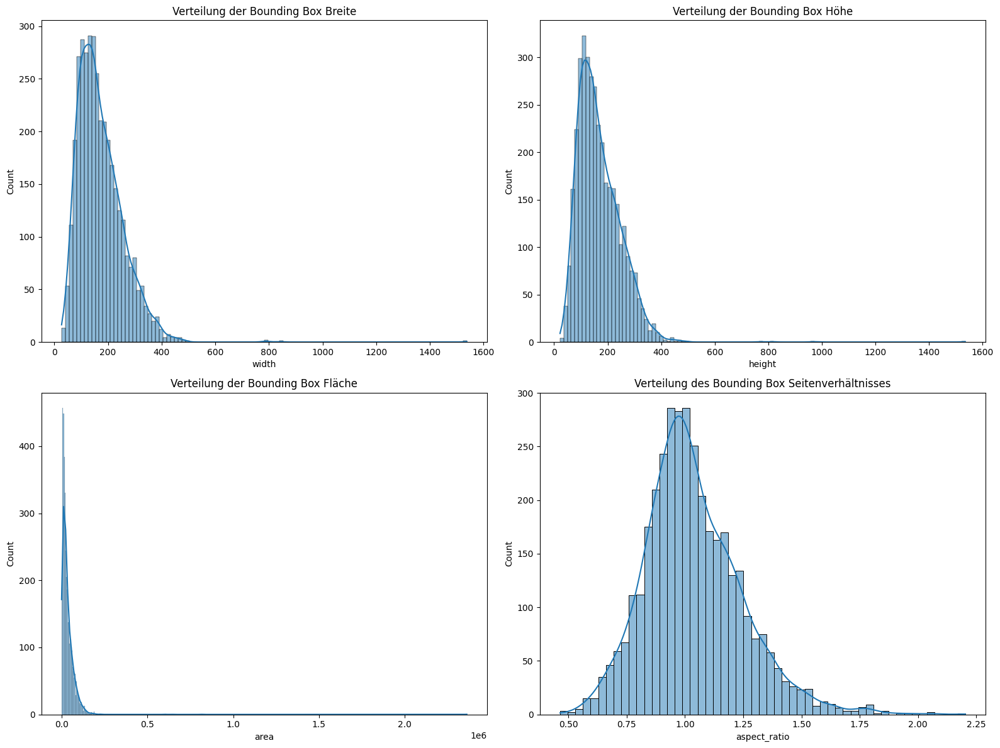

In [11]:
# Sammeln von Statistiken über Bounding Boxes
def analyze_bounding_boxes():
    """
    Analysiert die Größe und Position der Bounding Boxes aus den XML-Annotationen.
    """
    if not xml_files:
        print("Keine XML-Dateien gefunden!")
        return
    
    bbox_data = []
    
    for xml_path in xml_files:
        try:
            tree = ET.parse(xml_path)
            root = tree.getroot()
            for obj in root.findall('object'):
                bnd = obj.find('bndbox')
                if bnd is not None:
                    xmin = int(bnd.find('xmin').text)
                    ymin = int(bnd.find('ymin').text)
                    xmax = int(bnd.find('xmax').text)
                    ymax = int(bnd.find('ymax').text)
                    
                    width = xmax - xmin
                    height = ymax - ymin
                    area = width * height
                    aspect = width / height if height > 0 else 0
                    
                    bbox_data.append({
                        'file': os.path.basename(xml_path),
                        'xmin': xmin,
                        'ymin': ymin,
                        'xmax': xmax,
                        'ymax': ymax,
                        'width': width,
                        'height': height,
                        'area': area,
                        'aspect_ratio': aspect
                    })
        except Exception as e:
            print(f"Fehler beim Parsen der XML-Datei {xml_path}: {e}")
    
    if not bbox_data:
        print("Keine gültigen Bounding Box-Daten gefunden!")
        return
    
    # Daten in DataFrame konvertieren
    bbox_df = pd.DataFrame(bbox_data)
    
    # Statistiken anzeigen
    print("Bounding Box Statistik:")
    print(bbox_df[['width', 'height', 'area', 'aspect_ratio']].describe())
    
    # Visualisierungen
    fig, axes = plt.subplots(2, 2, figsize=(16, 12))
    
    # Breite
    sns.histplot(bbox_df['width'], kde=True, ax=axes[0, 0])
    axes[0, 0].set_title('Verteilung der Bounding Box Breite')
    
    # Höhe
    sns.histplot(bbox_df['height'], kde=True, ax=axes[0, 1])
    axes[0, 1].set_title('Verteilung der Bounding Box Höhe')
    
    # Fläche
    sns.histplot(bbox_df['area'], kde=True, ax=axes[1, 0])
    axes[1, 0].set_title('Verteilung der Bounding Box Fläche')
    
    # Seitenverhältnis
    sns.histplot(bbox_df['aspect_ratio'], kde=True, ax=axes[1, 1])
    axes[1, 1].set_title('Verteilung des Bounding Box Seitenverhältnisses')
    
    plt.tight_layout()
    plt.show()
    
    return bbox_df

# Bounding Box-Analyse durchführen
bbox_stats = analyze_bounding_boxes()

## Datensatz-Aufteilung für das Training

Diese Funktion teilt den Datensatz in Trainings-, Test- und Validierungsdaten auf. 
Die Aufteilung folgt einem speziellen Schema:
- Trainingsbilder: Alle Bilder, die mit einer Bounding-Box annotiert sind (50%)
- Test- und Validierungsbilder: Alle Bilder ohne Bounding-Box-Annotation
  - 80% für Test
  - 20% für Validierung

Kopiere Dateien in die Ausgabeverzeichnisse...
Kopiervorgang abgeschlossen:
 - 3686 Trainingsbilder nach c:\Users\fabud\Documents\GitHub\dlbs-mc-oliver-fabian\notebooks\eda\../../data\split_dataset\train
 - 3686 XML-Dateien nach c:\Users\fabud\Documents\GitHub\dlbs-mc-oliver-fabian\notebooks\eda\../../data\split_dataset\train\annotations
 - 2963 Testbilder nach c:\Users\fabud\Documents\GitHub\dlbs-mc-oliver-fabian\notebooks\eda\../../data\split_dataset\test
 - 741 Validierungsbilder nach c:\Users\fabud\Documents\GitHub\dlbs-mc-oliver-fabian\notebooks\eda\../../data\split_dataset\val

Datensatz-Aufteilung:
Gesamtzahl der Bilder: 7390
Trainingsbilder: 3686 (49.88%)
Testbilder: 2963 (40.09%)
Validierungsbilder: 741 (10.03%)



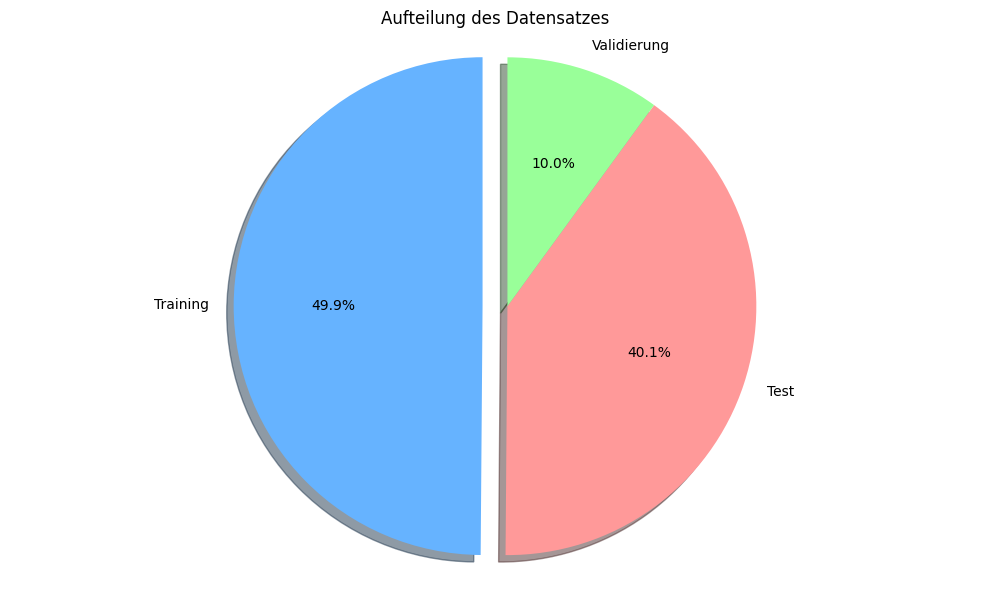

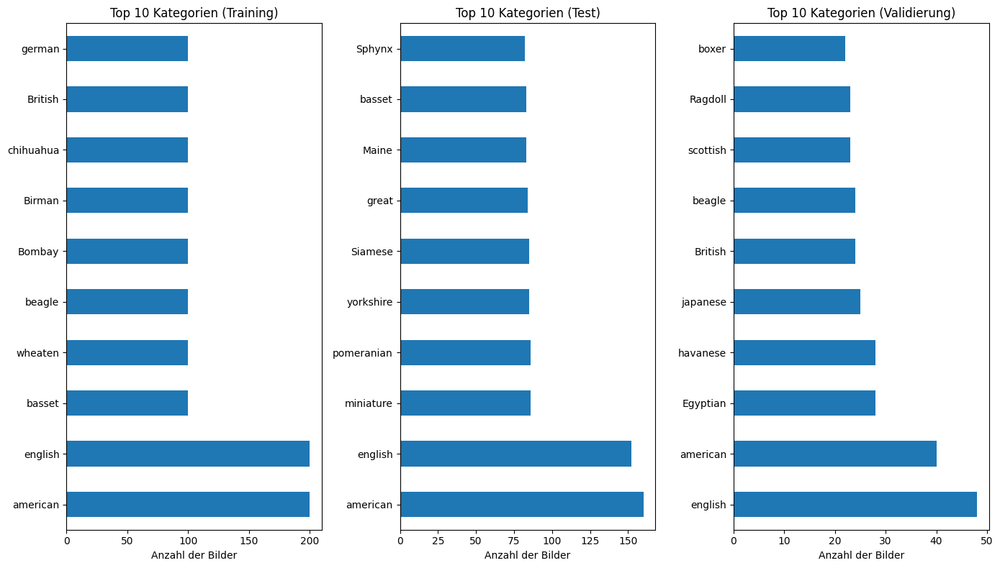

In [24]:
def split_dataset(image_files, xml_files, output_dir, test_size=0.8, random_state=42, copy_files=True):
    """
    Teilt den Datensatz in Trainings-, Test- und Validierungsdaten auf und kopiert die Dateien
    in die entsprechenden Verzeichnisse.
    
    Args:
        image_files (list): Liste aller Bildpfade
        xml_files (list): Liste aller XML-Annotationspfade
        output_dir (str): Ausgabeverzeichnis für die aufgeteilten Daten
        test_size (float): Anteil der Testdaten an den Bildern ohne Annotation (Standard: 0.8)
        random_state (int): Zufallsseed für reproduzierbare Ergebnisse
        copy_files (bool): Wenn True, werden die Dateien physisch kopiert
        
    Returns:
        dict: Dictionary mit den aufgeteilten Datensätzen und Statistiken
    """
    from sklearn.model_selection import train_test_split
    import shutil
    
    # Erstelle Ausgabeverzeichnisse falls sie nicht existieren
    train_dir = os.path.join(output_dir, "train")
    test_dir = os.path.join(output_dir, "test")
    val_dir = os.path.join(output_dir, "val")
    xml_train_dir = os.path.join(train_dir, "annotations")
    
    if copy_files:
        os.makedirs(train_dir, exist_ok=True)
        os.makedirs(test_dir, exist_ok=True)
        os.makedirs(val_dir, exist_ok=True)
        os.makedirs(xml_train_dir, exist_ok=True)
    
    # Extrahiere Basisnamen (ohne Pfad und Erweiterung)
    image_basenames = set([os.path.splitext(os.path.basename(f))[0] for f in image_files])
    xml_basenames = set([os.path.splitext(os.path.basename(f))[0] for f in xml_files])
    
    # Bilder mit Annotationen -> Training
    train_basenames = list(image_basenames & xml_basenames)
    
    # Bilder ohne Annotationen -> Test/Validierung
    non_annotated_basenames = list(image_basenames - xml_basenames)
    
    # Test/Validierungs-Split (80% Test, 20% Validierung)
    test_basenames, val_basenames = train_test_split(
        non_annotated_basenames, 
        test_size=(1-test_size),  # 1 - 0.8 = 0.2 (für Validierung)
        random_state=random_state
    )
    
    # Erstelle vollständige Pfade für jedes Set
    train_files = [f for f in image_files if os.path.splitext(os.path.basename(f))[0] in train_basenames]
    test_files = [f for f in image_files if os.path.splitext(os.path.basename(f))[0] in test_basenames]
    val_files = [f for f in image_files if os.path.splitext(os.path.basename(f))[0] in val_basenames]
    
    # XML-Dateien für Training
    train_xml_files = [f for f in xml_files if os.path.splitext(os.path.basename(f))[0] in train_basenames]
    
    # Kopiere Dateien wenn copy_files=True
    copied_files = {'train': 0, 'test': 0, 'val': 0, 'xml': 0}
    
    if copy_files:
        print("Kopiere Dateien in die Ausgabeverzeichnisse...")
        
        # Kopiere Trainingsbilder und XML-Dateien
        for img_file in train_files:
            dest = os.path.join(train_dir, os.path.basename(img_file))
            shutil.copy2(img_file, dest)
            copied_files['train'] += 1
        
        for xml_file in train_xml_files:
            dest = os.path.join(xml_train_dir, os.path.basename(xml_file))
            shutil.copy2(xml_file, dest)
            copied_files['xml'] += 1
        
        # Kopiere Testbilder
        for img_file in test_files:
            dest = os.path.join(test_dir, os.path.basename(img_file))
            shutil.copy2(img_file, dest)
            copied_files['test'] += 1
        
        # Kopiere Validierungsbilder
        for img_file in val_files:
            dest = os.path.join(val_dir, os.path.basename(img_file))
            shutil.copy2(img_file, dest)
            copied_files['val'] += 1
        
        print(f"Kopiervorgang abgeschlossen:")
        print(f" - {copied_files['train']} Trainingsbilder nach {train_dir}")
        print(f" - {copied_files['xml']} XML-Dateien nach {xml_train_dir}")
        print(f" - {copied_files['test']} Testbilder nach {test_dir}")
        print(f" - {copied_files['val']} Validierungsbilder nach {val_dir}")
    
    # Erstelle Kategorie-Verteilungen für jedes Set
    def get_category_distribution(file_list):
        categories = []
        for f in file_list:
            basename = os.path.splitext(os.path.basename(f))[0]
            # Kategorie aus Dateinamen extrahieren (z.B. 'Abyssinian' aus 'Abyssinian_123.jpg')
            if '_' in basename:
                categories.append(basename.split('_')[0])
        return pd.Series(categories).value_counts()
    
    train_dist = get_category_distribution(train_files)
    test_dist = get_category_distribution(test_files)
    val_dist = get_category_distribution(val_files)
    
    # Ergebnis erstellen
    result = {
        'train_files': train_files,
        'test_files': test_files,
        'val_files': val_files,
        'train_distribution': train_dist,
        'test_distribution': test_dist,
        'val_distribution': val_dist,
        'output_dirs': {
            'train': train_dir,
            'test': test_dir,
            'val': val_dir,
            'xml': xml_train_dir
        },
        'copied_files': copied_files,
        'stats': {
            'total_images': len(image_files),
            'train_size': len(train_files),
            'test_size': len(test_files),
            'val_size': len(val_files),
            'train_percentage': round(len(train_files) / len(image_files) * 100, 2),
            'test_percentage': round(len(test_files) / len(image_files) * 100, 2),
            'val_percentage': round(len(val_files) / len(image_files) * 100, 2)
        }
    }
    
    return result

# Ausgabeverzeichnis definieren
output_dir = os.path.join(DATA_DIR, 'split_dataset')

# Datensatz aufteilen und Dateien kopieren
dataset_split = split_dataset(image_files, xml_files, output_dir=output_dir, copy_files=True)

# Statistik anzeigen
print(f"\nDatensatz-Aufteilung:")
print(f"Gesamtzahl der Bilder: {dataset_split['stats']['total_images']}")
print(f"Trainingsbilder: {dataset_split['stats']['train_size']} ({dataset_split['stats']['train_percentage']}%)")
print(f"Testbilder: {dataset_split['stats']['test_size']} ({dataset_split['stats']['test_percentage']}%)")
print(f"Validierungsbilder: {dataset_split['stats']['val_size']} ({dataset_split['stats']['val_percentage']}%)\n")

# Visualisierung der Aufteilung
plt.figure(figsize=(10, 6))
labels = ['Training', 'Test', 'Validierung']
sizes = [
    dataset_split['stats']['train_size'],
    dataset_split['stats']['test_size'],
    dataset_split['stats']['val_size']
]
colors = ['#66b3ff', '#ff9999', '#99ff99']
explode = (0.1, 0, 0)  # Training leicht hervorheben

plt.pie(
    sizes, 
    explode=explode, 
    labels=labels, 
    colors=colors,
    autopct='%1.1f%%',
    shadow=True, 
    startangle=90
)
plt.axis('equal')
plt.title('Aufteilung des Datensatzes')
plt.tight_layout()
plt.show()

# Verteilung der Top-Kategorien in den einzelnen Sets anzeigen
plt.figure(figsize=(14, 8))
plt.subplot(1, 3, 1)
dataset_split['train_distribution'].head(10).plot(kind='barh')
plt.title('Top 10 Kategorien (Training)')
plt.xlabel('Anzahl der Bilder')

plt.subplot(1, 3, 2)
dataset_split['test_distribution'].head(10).plot(kind='barh')
plt.title('Top 10 Kategorien (Test)')
plt.xlabel('Anzahl der Bilder')

plt.subplot(1, 3, 3)
dataset_split['val_distribution'].head(10).plot(kind='barh')
plt.title('Top 10 Kategorien (Validierung)')
plt.xlabel('Anzahl der Bilder')

plt.tight_layout()
plt.show()